### Imports & Functions

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px

In [2]:
def get_prices(product_data, product_name):
    mid_price = product_data[product_name]['mid_price']
    best_bid = product_data[product_name]['bid_price_1']
    best_ask = product_data[product_name]['ask_price_1']
    return mid_price, best_bid, best_ask

def get_volumes(product_data, product_name):
    bid_volume = product_data[product_name]['bid_volume_1']
    ask_volume = product_data[product_name]['ask_volume_1']
    return bid_volume, ask_volume

In [3]:
# Load CSV file
filenames = ['round_1/prices_round_1_day_-2', 'round_1/prices_round_1_day_-1', 'round_1/prices_round_1_day_0']
data = pd.DataFrame()
for i, file in enumerate(filenames):
    df = pd.read_csv(f'data/{file}.csv', index_col='timestamp', sep=';').drop(columns='day')
    df.index = df.index + 1000000 * i
    data = pd.concat([data, df])

# Get data for each product
product_data = {
    product: data[data['product'] == product].drop(columns='product')
    for product in data['product'].unique()
}
print('Available products:', list(product_data.keys()))

Available products: ['AMETHYSTS', 'STARFRUIT']


### AMETHYSTS

In [4]:
product_name = 'AMETHYSTS'
mid_price, best_bid, best_ask = get_prices(product_data, product_name)
bid_volume, ask_volume = get_volumes(product_data, product_name)
px.line(mid_price)

<Axes: xlabel='timestamp'>

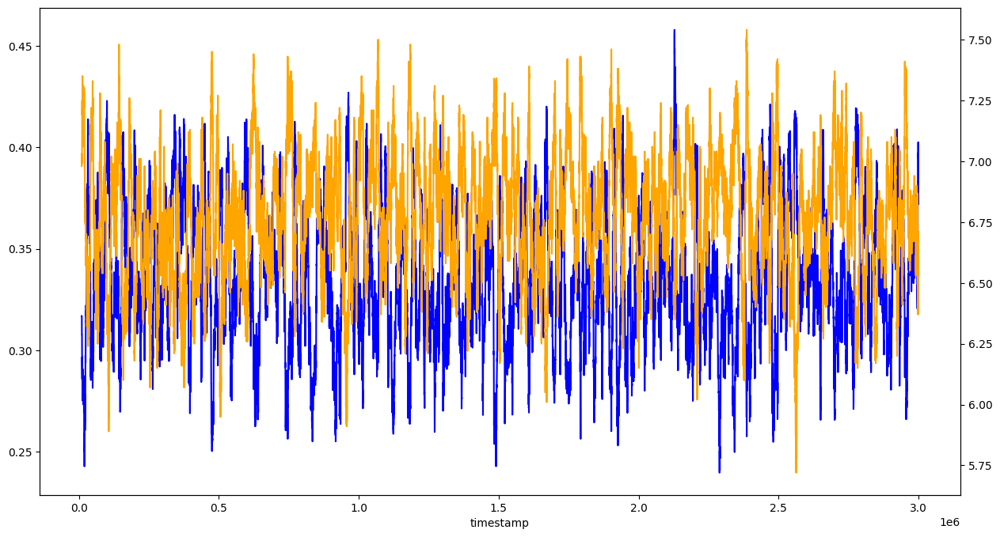

In [5]:
vol = mid_price.pct_change().rolling(100).std() * np.sqrt(252) * 100
spread = (best_ask - best_bid).rolling(window=100).mean()

ax1 = vol.plot(figsize=(15, 8), color='blue')
ax2 = ax1.twinx()
spread.plot(figsize=(15, 8), ax=ax2, color='orange')

In [6]:
pnl = np.array([0.0])
nav, cash = 0, 0
q = 0
fair_price = mid_price.rolling(100).mean().fillna(10000)
for i in range(1, len(fair_price)):
    shift_buy = 0
    if q > 0:
        shift_buy = -1
    
    shift_sell = 0
    if q < 0:
        shift_sell = 1
        
    if best_bid.iloc[i - 1] >= fair_price.iloc[i - 1] + shift_sell:
        new_q = np.maximum(q - bid_volume.iloc[i - 1], -20)
        cash += (q - new_q) * best_bid.iloc[i - 1]
        q = new_q
        
    elif best_ask.iloc[i - 1] <= fair_price.iloc[i - 1] + shift_buy:
        new_q = np.minimum(q + ask_volume.iloc[i - 1], 20)
        cash -= (new_q - q) * best_ask.iloc[i - 1]
        q = new_q
    
    nav = q * best_bid.iloc[i] if q > 0 else (q * best_ask.iloc[i] if q < 0 else 0)
    pnl = np.append(pnl, cash + nav)

pnl = pd.Series(pnl, index=mid_price.index, name='PnL')
px.line(pnl)

### STARFRUIT

In [7]:
product_name = 'STARFRUIT'
mid_price, best_bid, best_ask = get_prices(product_data, product_name)
bid_volume, ask_volume = get_volumes(product_data, product_name)
px.line(mid_price)

<Axes: xlabel='timestamp'>

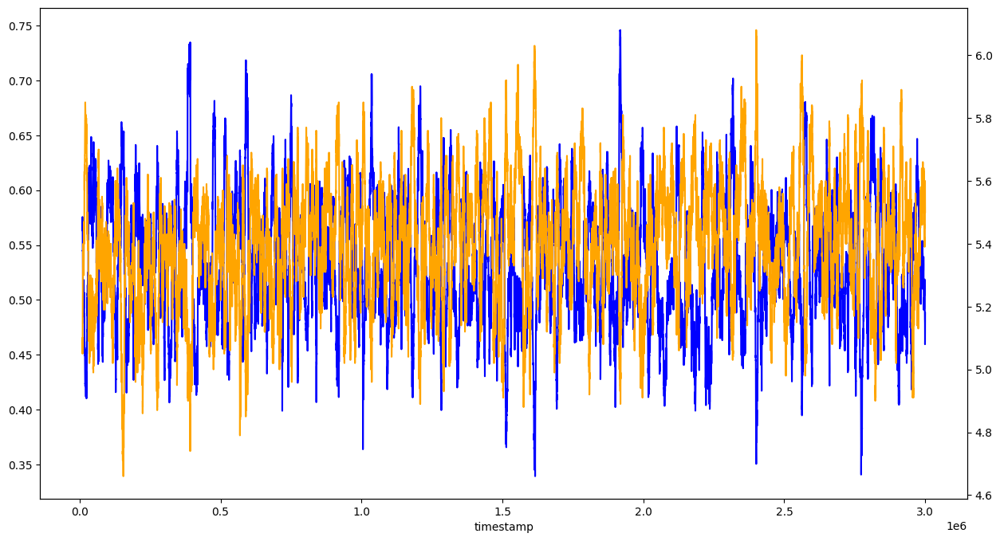

In [8]:
vol = mid_price.pct_change().rolling(100).std() * np.sqrt(252) * 100
spread = (best_ask - best_bid).rolling(window=100).mean()

ax1 = vol.plot(figsize=(15, 8), color='blue')
ax2 = ax1.twinx()
spread.plot(figsize=(15, 8), ax=ax2, color='orange')

In [9]:
pnl = np.array([0.0])
nav, cash = 0, 0
q = 0

fair_price = mid_price.rolling(window=5, min_periods=1).apply(lambda x: x.ewm(span=20).mean().values[-1])
average_price = mid_price.rolling(window=5, min_periods=1).mean()
window = 150
z_score = (average_price - average_price.rolling(window).min()) / (average_price.rolling(window).max() - average_price.rolling(window).min())
z_score.fillna(0.5, inplace=True)
z_score_rolling = z_score.rolling(100, min_periods=1).mean()
z_score_rolling = 2 * (z_score_rolling - 0.5)

for i in range(1, len(fair_price)):
    delta_ask = -z_score_rolling.iloc[i - 1] if z_score_rolling.iloc[i - 1] < -0.5 else 0
    delta_bid = z_score_rolling.iloc[i - 1] if z_score_rolling.iloc[i - 1] > 0.5 else 0
    
    shift_buy = 0
    if q > 10:
        shift_buy = -0.25
    
    shift_sell = 0
    if q < -10:
        shift_sell = 0.25
    
    if best_bid.iloc[i - 1] >= fair_price.iloc[i - 1] + delta_bid + shift_sell:
        new_q = np.maximum(q - bid_volume.iloc[i - 1], -20)
        cash += (q - new_q) * best_bid.iloc[i - 1]
        q = new_q
        
    elif best_ask.iloc[i - 1] <= fair_price.iloc[i - 1] - delta_ask + shift_buy:
        new_q = np.minimum(q + ask_volume.iloc[i - 1], 20)
        cash -= (new_q - q) * best_ask.iloc[i - 1]
        q = new_q
    
    nav = q * best_bid.iloc[i] if q > 0 else (q * best_ask.iloc[i] if q < 0 else 0)
    pnl = np.append(pnl, cash + nav)

pnl = pd.Series(pnl, index=mid_price.index, name='PnL')
px.line(pnl)

### ORCHIDS

In [2]:
df_orchids = pd.read_csv('data/round_2/prices_round_2_day_1.csv', index_col=0, sep=';').drop(columns='DAY')
display(df_orchids.head())

,ORCHIDS,TRANSPORT_FEES,EXPORT_TARIFF,IMPORT_TARIFF,SUNLIGHT,HUMIDITY
timestamp,,,,,,
0,1098.25,0.9,10.5,-5.0,2100.0000,70.000000
100,1098.25,0.9,9.5,-5.0,2099.7570,70.022710
200,1096.75,0.9,9.5,-5.0,2099.5132,70.045395
300,1097.00,0.9,9.5,-5.0,2099.2683,70.068030
400,1097.25,0.9,9.5,-5.0,2099.0225,70.090640


In [3]:
mid_price = df_orchids.ORCHIDS.loc[:1000000]
px.line(mid_price)